# LST Interactive Map — VS Code Version (1999–2025)
**Runs locally in VS Code.** Data is exported from GEE → Google Drive,
then downloaded directly to your machine via `gdown` — no Colab RAM crash.

## Requirements
```
pip install earthengine-api geemap numpy pandas rasterio scikit-learn
    matplotlib joblib gdown xgboost tensorflow
```
Also run once in terminal: `earthengine authenticate`

In [1]:
# ── 0. Installs (run once) ───────────────────────────────────────────────────
# Uncomment the line below the first time you set up this environment.
# !pip install earthengine-api geemap numpy pandas rasterio scikit-learn matplotlib joblib gdown xgboost tensorflow

import ee
import geemap
import numpy as np
import pandas as pd
import rasterio
import joblib
import logging
import os
import gdown
import time

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, roc_curve, auc
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from xgboost import XGBRegressor, XGBClassifier

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input

logging.getLogger('rasterio').setLevel(logging.ERROR)

# ── Authenticate & initialise GEE ────────────────────────────────────────────
# If running for the first time, run in your terminal:  earthengine authenticate
ee.Initialize(project='lst-project-491109')   # ← replace with your project id
print(f'GEE initialised. geemap version: {geemap.__version__}')

c:\Users\Dharshan Rajiv .T\anaconda3\envs\lst_predict_env\lib\site-packages\google\api_core\_python_version_support.py:275: FutureWarning: You are using a Python version (3.10.20) which Google will stop supporting in new releases of google.api_core once it reaches its end of life (2026-10-04). Please upgrade to the latest Python version, or at least Python 3.11, to continue receiving updates for google.api_core past that date.
  warnings.warn(message, FutureWarning)


GEE initialised. geemap version: 0.37.2


## Step 1 — Build multi-sensor GEE composite (1999–2025)

In [2]:
# ── 1a. AOI ──────────────────────────────────────────────────────────────────
aoi = ee.Geometry.Rectangle([76.70, 10.72, 77.60, 11.25])

# ── 1b. Cloud mask ────────────────────────────────────────────────────────────
def mask_clouds(img):
    qa = img.select('QA_PIXEL')
    cloud_free = (
        qa.bitwiseAnd(1 << 3).eq(0)
          .And(qa.bitwiseAnd(1 << 5).eq(0))
    )
    return img.updateMask(cloud_free)

# ── 1c. Harmonise Landsat 5/7 band names to match L8/L9 ─────────────────────
def rename_l57(img):
    return (
        img.select(['SR_B3', 'SR_B4', 'SR_B2', 'SR_B5'],
                   ['SR_B4', 'SR_B5', 'SR_B3', 'SR_B6'])
           .addBands(img.select('ST_B6').rename('ST_B10'))
           .copyProperties(img, img.propertyNames())
    )

DATE_START = '1999-01-01'
DATE_END   = '2025-12-31'
common_bands = ['SR_B4', 'SR_B5', 'SR_B3', 'SR_B6', 'ST_B10']

l5 = (
    ee.ImageCollection('LANDSAT/LT05/C02/T1_L2')
    .filterBounds(aoi).filterDate(DATE_START, '2013-06-30')
    .map(mask_clouds).map(rename_l57).select(common_bands)
)
l7 = (
    ee.ImageCollection('LANDSAT/LE07/C02/T1_L2')
    .filterBounds(aoi).filterDate(DATE_START, DATE_END)
    .map(mask_clouds).map(rename_l57).select(common_bands)
)
l8 = (
    ee.ImageCollection('LANDSAT/LC08/C02/T1_L2')
    .filterBounds(aoi).filterDate('2013-04-01', DATE_END)
    .map(mask_clouds).select(common_bands)
)
l9 = (
    ee.ImageCollection('LANDSAT/LC09/C02/T1_L2')
    .filterBounds(aoi).filterDate('2021-10-01', DATE_END)
    .map(mask_clouds).select(common_bands)
)

collection = l5.merge(l7).merge(l8).merge(l9).median()

# ── 1d. Indices + LST ────────────────────────────────────────────────────────
ndvi  = collection.normalizedDifference(['SR_B5', 'SR_B4']).rename('NDVI').toFloat()
ndbi  = collection.normalizedDifference(['SR_B6', 'SR_B5']).rename('NDBI').toFloat()
mndwi = collection.normalizedDifference(['SR_B3', 'SR_B6']).rename('MNDWI').toFloat()
bsi = (
    collection.expression(
        '((SWIR + RED) - (NIR + BLUE)) / ((SWIR + RED) + (NIR + BLUE))',
        {
            'SWIR': collection.select('SR_B6'),
            'RED' : collection.select('SR_B4'),
            'NIR' : collection.select('SR_B5'),
            'BLUE': collection.select('SR_B3')
        }
    ).rename('BSI').toFloat()
)
lst_celsius = (
    collection.select('ST_B10')
    .multiply(0.00341802).add(149.0).subtract(273.15)
    .rename('LST_C').toFloat()
)

image = ndvi.addBands(ndbi).addBands(mndwi).addBands(bsi).addBands(lst_celsius).clip(aoi)

band_types = image.bandTypes().getInfo()
for band, dtype in band_types.items():
    print(f'  {band}: {dtype["precision"]}')
print('\nAll bands Float32 — safe to export.')

  BSI: float
  LST_C: float
  MNDWI: float
  NDBI: float
  NDVI: float

All bands Float32 — safe to export.


## Step 2 — Export to Google Drive (GEE batch job)

In [ ]:
# ── 2. GEE batch export → Google Drive ──────────────────────────────────────
import time

EXPORT_SCALE = 30
DRIVE_FOLDER = 'GEE_Exports'
FILE_PREFIX  = 'gee_data_30m_extended'

try:
    task = ee.batch.Export.image.toDrive(
        image          = image,
        description    = 'LST_Coimbatore_30m',
        folder         = DRIVE_FOLDER,
        fileNamePrefix = FILE_PREFIX,
        scale          = EXPORT_SCALE,
        region         = aoi,
        maxPixels      = 1e13,
        fileFormat     = 'GeoTIFF',
        formatOptions  = {'cloudOptimized': True, 'noData': -9999}
    )
    task.start()
    print('Export started — polling every 30 s ...')
    while True:
        try:
            status = task.status()
            state  = status['state']
            print(f'  Task state: {state}')
            if state in ('COMPLETED', 'FAILED', 'CANCELLED'):
                break
        except Exception as poll_err:
            print(f'  Poll error (will retry): {poll_err}')
        time.sleep(30)
    if state == 'COMPLETED':
        print(f'\n✅ Export complete — file: {FILE_PREFIX}.tif in Drive/{DRIVE_FOLDER}')
    else:
        print(f'\n❌ Export failed: {status.get("error_message", "")}')
except Exception as e:
    print(f'❌ Export task could not be started: {e}')
    print('   Check GEE authentication and project ID.')


## Step 3 — Download the GeoTIFF from Google Drive to your local machine

In [3]:
# ── 3. Download GeoTIFF from Google Drive using gdown ────────────────────────
GDRIVE_FILE_ID = '1E3XTBFYbEOX6_34MLjdeUxBZS0weMaeB'   # ← replace this
LOCAL_DIR  = 'data'
LOCAL_TIFF = os.path.join(LOCAL_DIR, 'gee_data_30m_new.tif')
os.makedirs(LOCAL_DIR, exist_ok=True)

if GDRIVE_FILE_ID == 'PASTE YOUR_FILE_ID_HERE':
    print('⚠️  Please set GDRIVE_FILE_ID above first!')
else:
    if os.path.exists(LOCAL_TIFF) and os.path.getsize(LOCAL_TIFF) > 1_000_000:
        print(f'File already exists locally: {LOCAL_TIFF}  — skipping download.')
    else:
        # Remove any partial/zero-byte file before downloading
        if os.path.exists(LOCAL_TIFF):
            os.remove(LOCAL_TIFF)
            print('Removed incomplete local file, re-downloading...')
        print('Downloading from Google Drive...')
        try:
            url = f'https://drive.google.com/uc?id={GDRIVE_FILE_ID}'
            gdown.download(url, LOCAL_TIFF, quiet=False)
            if not os.path.exists(LOCAL_TIFF) or os.path.getsize(LOCAL_TIFF) < 1_000_000:
                raise RuntimeError('Downloaded file is missing or suspiciously small — check your File ID and sharing settings.')
            print(f'\n✅ Downloaded → {LOCAL_TIFF}  ({os.path.getsize(LOCAL_TIFF)/1e6:.1f} MB)')
        except Exception as e:
            if os.path.exists(LOCAL_TIFF):
                os.remove(LOCAL_TIFF)  # Remove partial download
            raise RuntimeError(f'Download failed: {e}') from e


Downloading...
From (original): https://drive.google.com/uc?id=1E3XTBFYbEOX6_34MLjdeUxBZS0weMaeB
From (redirected): https://drive.google.com/uc?id=1E3XTBFYbEOX6_34MLjdeUxBZS0weMaeB&confirm=t&uuid=138f0a0b-3c8f-4193-a19b-3261ad9616bd
To: c:\Users\Dharshan Rajiv .T\Downloads\New folder (3)\data\gee_data_30m_new.tif
100%|██████████| 206M/206M [00:21<00:00, 9.55MB/s] 


✅ Downloaded → data\gee_data_30m_new.tif  (206.1 MB)


In [ ]:
# ── 3b. ALTERNATIVE: download using the full share link (fuzzy mode) ─────────
# Use this if you don't want to extract the file ID manually.

# SHARE_LINK = 'https://drive.google.com/file/d/YOUR_ID_HERE/view?usp=sharing'
# gdown.download(url=SHARE_LINK, output=LOCAL_TIFF, fuzzy=True, quiet=False)
# print(f'Downloaded → {LOCAL_TIFF}')

print('(Cell skipped — using direct file ID in Step 3 above)')

## Step 4 — Read raster locally (no RAM crash — streamed band by band)

In [3]:
# ── 4. Read raster from LOCAL disk — band by band to stay memory-efficient ───
LOCAL_DIR   = 'data'
LOCAL_TIFF  = os.path.join(LOCAL_DIR, 'gee_data_30m_new.tif')
EXPORT_PATH = LOCAL_TIFF

if not os.path.exists(EXPORT_PATH):
    raise FileNotFoundError(f'GeoTIFF not found at {EXPORT_PATH}. Run Step 3 first.')

with rasterio.open(EXPORT_PATH) as src:
    if src.count < 5:
        raise ValueError(f'Expected 5 bands (NDVI/NDBI/MNDWI/BSI/LST_C) but got {src.count}. '
                         f'Re-export from GEE with all bands.')
    ndvi_arr  = src.read(1).astype('float32')
    ndbi_arr  = src.read(2).astype('float32')
    mndwi_arr = src.read(3).astype('float32')
    bsi_arr   = src.read(4).astype('float32')
    lst_arr   = src.read(5).astype('float32')
    meta      = src.meta.copy()
    crs       = src.crs
    transform = src.transform

for arr in [ndvi_arr, ndbi_arr, mndwi_arr, bsi_arr, lst_arr]:
    arr[arr == -9999] = np.nan

rows, cols = ndvi_arr.shape
print(f'Raster shape : {rows} x {cols}')
print(f'CRS          : {crs}')
print(f'LST range    : {np.nanmin(lst_arr):.1f} °C  →  {np.nanmax(lst_arr):.1f} °C')

nan_pct = np.isnan(lst_arr).mean() * 100
print(f'NaN pixels   : {nan_pct:.1f}%')
if nan_pct > 80:
    print('⚠️  WARNING: over 80% NaN — heavy cloud cover or nodata. Results may be unreliable.')


Raster shape : 1969 x 3341
CRS          : EPSG:4326
LST range    : 15.8 °C  →  49.4 °C
NaN pixels   : 0.1%


## Step 5 — Year-wise modeling (1999–2020 train, 2021–2025 test) + future (2030, 2040)

Year 1999: 2,500 samples
Year 2000: 2,499 samples
Year 2001: 2,500 samples
Year 2002: 2,500 samples
Year 2003: 2,500 samples
Year 2004: 2,499 samples
Year 2005: 2,499 samples
Year 2006: 2,500 samples
Year 2007: 2,500 samples
Year 2008: 2,500 samples
Year 2009: 2,500 samples
Year 2010: 2,500 samples
Year 2011: 2,500 samples
Year 2012: 2,500 samples
Year 2013: 2,499 samples
Year 2014: 2,500 samples
Year 2015: 2,500 samples
Year 2016: 2,500 samples
Year 2017: 2,500 samples
Year 2018: 2,500 samples
Year 2019: 2,499 samples
Year 2020: 2,500 samples
Year 2021: 2,500 samples
Year 2022: 1,799 samples
Year 2023: 2,500 samples
Year 2024: 2,500 samples
Year 2025: 2,500 samples
Train years: 1999-2020 (54,995 rows)
Test years : 2021-2025 (11,799 rows)
High-LST threshold (train 75th pct): 40.97 °C

XGBoost (regression):
  MAE  : 2.344 °C
  RMSE : 2.925 °C
  R²   : 0.4602

LSTM (regression):
  MAE  : 2.300 °C
  RMSE : 2.877 °C
  R²   : 0.4778

Decision Tree (regression):
  MAE  : 2.542 °C
  RMSE : 3.

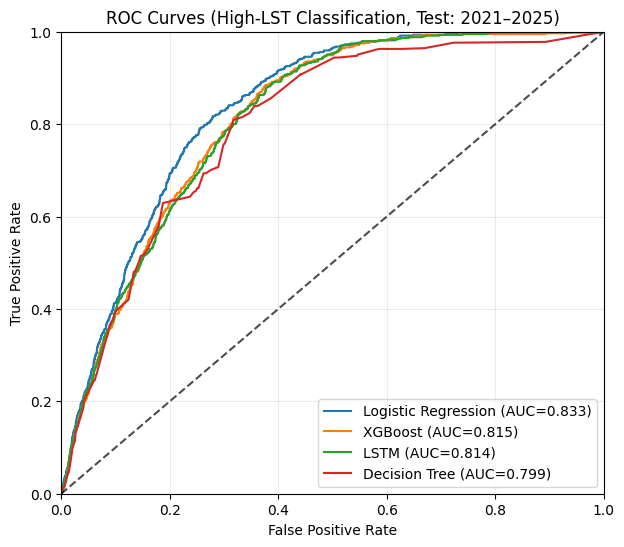

Saved → data\roc_auc_models.png
Best regression RMSE on test set: LSTM (2.877 °C)
Model saved → data\lst_xgb_model.pkl


In [5]:
# ── 5a. Build year-wise dataframe from annual GEE composites ──────────────────
def build_year_image(year: int):
    start = ee.Date.fromYMD(year, 1, 1)
    end = start.advance(1, 'year')

    yl5 = (
        ee.ImageCollection('LANDSAT/LT05/C02/T1_L2')
        .filterBounds(aoi)
        .filterDate(start, end)
        .map(mask_clouds)
        .map(rename_l57)
        .select(common_bands)
    )
    yl7 = (
        ee.ImageCollection('LANDSAT/LE07/C02/T1_L2')
        .filterBounds(aoi)
        .filterDate(start, end)
        .map(mask_clouds)
        .map(rename_l57)
        .select(common_bands)
    )
    yl8 = (
        ee.ImageCollection('LANDSAT/LC08/C02/T1_L2')
        .filterBounds(aoi)
        .filterDate(start, end)
        .map(mask_clouds)
        .select(common_bands)
    )
    yl9 = (
        ee.ImageCollection('LANDSAT/LC09/C02/T1_L2')
        .filterBounds(aoi)
        .filterDate(start, end)
        .map(mask_clouds)
        .select(common_bands)
    )

    yearly = yl5.merge(yl7).merge(yl8).merge(yl9)
    if yearly.size().getInfo() == 0:
        return None

    comp = yearly.median()
    ndvi_y = comp.normalizedDifference(['SR_B5', 'SR_B4']).rename('NDVI').toFloat()
    ndbi_y = comp.normalizedDifference(['SR_B6', 'SR_B5']).rename('NDBI').toFloat()
    mndwi_y = comp.normalizedDifference(['SR_B3', 'SR_B6']).rename('MNDWI').toFloat()
    bsi_y = (
        comp.expression(
            '((SWIR + RED) - (NIR + BLUE)) / ((SWIR + RED) + (NIR + BLUE))',
            {
                'SWIR': comp.select('SR_B6'),
                'RED': comp.select('SR_B4'),
                'NIR': comp.select('SR_B5'),
                'BLUE': comp.select('SR_B3'),
            },
        )
        .rename('BSI')
        .toFloat()
    )
    lst_y = (
        comp.select('ST_B10')
        .multiply(0.00341802)
        .add(149.0)
        .subtract(273.15)
        .rename('LST_C')
        .toFloat()
    )

    return (
        ndvi_y.addBands(ndbi_y)
        .addBands(mndwi_y)
        .addBands(bsi_y)
        .addBands(lst_y)
        .clip(aoi)
    )


def sample_year_df(year: int, n_points: int = 2500):
    img_y = build_year_image(year)
    if img_y is None:
        return pd.DataFrame()

    sample_trials = [
        {'numPixels': n_points, 'scale': 30, 'tileScale': 1},
        {'numPixels': min(n_points, 1800), 'scale': 30, 'tileScale': 2},
        {'numPixels': min(n_points, 1200), 'scale': 30, 'tileScale': 4},
        {'numPixels': min(n_points, 800), 'scale': 60, 'tileScale': 4},
    ]

    rows_y = []
    last_err = None

    for cfg in sample_trials:
        for attempt in range(3):
            try:
                fc = img_y.sample(
                    region=aoi,
                    scale=cfg['scale'],
                    numPixels=cfg['numPixels'],
                    geometries=False,
                    seed=year,
                    tileScale=cfg['tileScale'],
                )
                rows_y = fc.getInfo().get('features', [])
                if rows_y:
                    break
            except Exception as e:
                last_err = e
                msg = str(e).lower()
                if ('ssl' in msg) or ('connection' in msg) or ('eof' in msg) or ('timed out' in msg):
                    time.sleep(2 * (attempt + 1))
                    continue
                break
        if rows_y:
            break

    if not rows_y:
        print(f'Year {year}: sampling failed ({last_err})')
        return pd.DataFrame()

    recs = []
    for f in rows_y:
        p = f.get('properties', {})
        recs.append({
            'year': year,
            'NDVI': p.get('NDVI'),
            'NDBI': p.get('NDBI'),
            'MNDWI': p.get('MNDWI'),
            'BSI': p.get('BSI'),
            'LST_C': p.get('LST_C'),
        })

    df_y = pd.DataFrame(recs)
    if df_y.empty:
        return df_y

    return df_y.replace([np.inf, -np.inf], np.nan).dropna()


years = list(range(1999, 2026))
year_dfs = []

for y in years:
    df_y = sample_year_df(y)
    if not df_y.empty:
        year_dfs.append(df_y)
        print(f'Year {y}: {len(df_y):,} samples')
    else:
        print(f'Year {y}: no valid samples')

df = pd.concat(year_dfs, ignore_index=True) if year_dfs else pd.DataFrame()
if df.empty:
    raise RuntimeError('No valid year-wise training data found from GEE samples.')

train_df = df[(df['year'] >= 1999) & (df['year'] <= 2020)].copy()
test_df = df[(df['year'] >= 2021) & (df['year'] <= 2025)].copy()

if train_df.empty or test_df.empty:
    raise RuntimeError('Train/test split is empty. Check yearly sample availability.')

print(f"Train years: {int(train_df['year'].min())}-{int(train_df['year'].max())} ({len(train_df):,} rows)")
print(f"Test years : {int(test_df['year'].min())}-{int(test_df['year'].max())} ({len(test_df):,} rows)")

feature_cols = ['NDVI', 'NDBI', 'MNDWI', 'BSI']
X_train = train_df[feature_cols].values
y_train = train_df['LST_C'].values
X_test = test_df[feature_cols].values
y_test = test_df['LST_C'].values

# Binary label for ROC/AUC (high-LST class)
threshold = float(np.percentile(train_df['LST_C'].values, 75))
y_train_bin = (y_train >= threshold).astype(int)
y_test_bin = (y_test >= threshold).astype(int)
print(f'High-LST threshold (train 75th pct): {threshold:.2f} °C')

# ── 5b. Train XGBoost regressor ───────────────────────────────────────────────
xgb_reg = XGBRegressor(
    n_estimators=300,
    max_depth=6,
    learning_rate=0.05,
    subsample=0.9,
    colsample_bytree=0.9,
    random_state=42,
)
xgb_reg.fit(X_train, y_train)
y_pred_xgb = xgb_reg.predict(X_test)
print('\nXGBoost (regression):')
print(f"  MAE  : {mean_absolute_error(y_test, y_pred_xgb):.3f} °C")
print(f"  RMSE : {np.sqrt(mean_squared_error(y_test, y_pred_xgb)):.3f} °C")
print(f"  R²   : {r2_score(y_test, y_pred_xgb):.4f}")

# ── 5c. Train LSTM regressor (simple sequence length = 1) ────────────────────
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_train_lstm = X_train_scaled.reshape((X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
X_test_lstm = X_test_scaled.reshape((X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

import tensorflow as tf
tf.keras.backend.clear_session()  # Free any leftover GPU/CPU graph memory

lstm_reg = Sequential([
    Input(shape=(1, X_train_lstm.shape[2])),
    LSTM(32),
    Dense(16, activation='relu'),
    Dense(1),
])
lstm_reg.compile(optimizer='adam', loss='mse')
lstm_reg.fit(X_train_lstm, y_train, epochs=20, batch_size=128, verbose=0)
y_pred_lstm = lstm_reg.predict(X_test_lstm, verbose=0).flatten()
print('\nLSTM (regression):')
print(f"  MAE  : {mean_absolute_error(y_test, y_pred_lstm):.3f} °C")
print(f"  RMSE : {np.sqrt(mean_squared_error(y_test, y_pred_lstm)):.3f} °C")
print(f"  R²   : {r2_score(y_test, y_pred_lstm):.4f}")

# ── 5d. Train Decision Tree regressor ────────────────────────────────────────
dt_reg = DecisionTreeRegressor(max_depth=12, min_samples_leaf=8, random_state=42)
dt_reg.fit(X_train, y_train)
y_pred_dt = dt_reg.predict(X_test)
print('\nDecision Tree (regression):')
print(f"  MAE  : {mean_absolute_error(y_test, y_pred_dt):.3f} °C")
print(f"  RMSE : {np.sqrt(mean_squared_error(y_test, y_pred_dt)):.3f} °C")
print(f"  R²   : {r2_score(y_test, y_pred_dt):.4f}")

# ── 5d2. Logistic Regression classifier for high-LST class ───────────────────
logit_clf = Pipeline([
    ('scaler', StandardScaler()),
    ('clf', LogisticRegression(max_iter=2000, random_state=42)),
])
logit_clf.fit(X_train, y_train_bin)
logit_prob = logit_clf.predict_proba(X_test)[:, 1]
logit_pred = (logit_prob >= 0.5).astype(int)
print('\nLogistic Regression (classification):')
print(f"  Accuracy: {(logit_pred == y_test_bin).mean():.4f}")

# XGBoost classifier (for ROC/AUC comparison)
xgb_clf = XGBClassifier(
    n_estimators=250,
    max_depth=5,
    learning_rate=0.05,
    subsample=0.9,
    colsample_bytree=0.9,
    eval_metric='logloss',
    random_state=42,
)
xgb_clf.fit(X_train, y_train_bin)
xgb_prob = xgb_clf.predict_proba(X_test)[:, 1]

# Decision Tree classifier
dt_clf = DecisionTreeClassifier(max_depth=8, min_samples_leaf=8, random_state=42)
dt_clf.fit(X_train, y_train_bin)
dt_prob = dt_clf.predict_proba(X_test)[:, 1]

# LSTM classifier
lstm_clf = Sequential([
    Input(shape=(1, X_train_lstm.shape[2])),
    LSTM(24),
    Dense(12, activation='relu'),
    Dense(1, activation='sigmoid'),
])
lstm_clf.compile(optimizer='adam', loss='binary_crossentropy')
lstm_clf.fit(X_train_lstm, y_train_bin, epochs=20, batch_size=128, verbose=0)
lstm_prob = lstm_clf.predict(X_test_lstm, verbose=0).flatten()

# ROC/AUC
fpr_log, tpr_log, _ = roc_curve(y_test_bin, logit_prob)
fpr_xgb, tpr_xgb, _ = roc_curve(y_test_bin, xgb_prob)
fpr_lstm, tpr_lstm, _ = roc_curve(y_test_bin, lstm_prob)
fpr_dt, tpr_dt, _ = roc_curve(y_test_bin, dt_prob)

auc_log = auc(fpr_log, tpr_log)
auc_xgb = auc(fpr_xgb, tpr_xgb)
auc_lstm = auc(fpr_lstm, tpr_lstm)
auc_dt = auc(fpr_dt, tpr_dt)

print('\nAUC scores:')
print(f'  Logistic Regression: {auc_log:.4f}')
print(f'  XGBoost            : {auc_xgb:.4f}')
print(f'  LSTM               : {auc_lstm:.4f}')
print(f'  Decision Tree      : {auc_dt:.4f}')

import matplotlib.pyplot as plt

plt.figure(figsize=(7, 6))
plt.plot(fpr_log, tpr_log, label=f'Logistic Regression (AUC={auc_log:.3f})')
plt.plot(fpr_xgb, tpr_xgb, label=f'XGBoost (AUC={auc_xgb:.3f})')
plt.plot(fpr_lstm, tpr_lstm, label=f'LSTM (AUC={auc_lstm:.3f})')
plt.plot(fpr_dt, tpr_dt, label=f'Decision Tree (AUC={auc_dt:.3f})')
plt.plot([0, 1], [0, 1], 'k--', alpha=0.7)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves (High-LST Classification, Test: 2021–2025)')
plt.legend()
plt.grid(alpha=0.25)

roc_png = os.path.join(LOCAL_DIR, 'roc_auc_models.png')
plt.savefig(roc_png, dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved → {roc_png}')

# Save primary regression model for raster prediction
rmse_xgb = float(np.sqrt(mean_squared_error(y_test, y_pred_xgb)))
rmse_lstm = float(np.sqrt(mean_squared_error(y_test, y_pred_lstm)))
rmse_dt = float(np.sqrt(mean_squared_error(y_test, y_pred_dt)))

reg_rmse = {
    'XGBoost': rmse_xgb,
    'LSTM': rmse_lstm,
    'DecisionTree': rmse_dt,
}
best_model_name = min(reg_rmse, key=reg_rmse.get)
print(f"Best regression RMSE on test set: {best_model_name} ({reg_rmse[best_model_name]:.3f} °C)")

model_lookup = {
    'XGBoost': xgb_reg,
    'LSTM': lstm_reg,
    'DecisionTree': dt_reg,
}
model = model_lookup[best_model_name]
model_path = os.path.join(LOCAL_DIR, 'lst_xgb_model.pkl')
joblib.dump(model, model_path)
print(f'Model saved → {model_path}')

In [6]:
# ── 5e. Predict 2025 baseline raster (from the downloaded GeoTIFF) ───────────
import gc

chunk_size = 250000
df_full = pd.DataFrame({
    'NDVI': ndvi_arr.reshape(-1),
    'NDBI': ndbi_arr.reshape(-1),
    'MNDWI': mndwi_arr.reshape(-1),
    'BSI': bsi_arr.reshape(-1),
})
df_full = df_full.replace([np.inf, -np.inf], np.nan)
valid_mask = df_full.notna().all(axis=1).to_numpy()
pred_flat = np.full(rows * cols, np.nan, dtype='float32')
valid_idx = np.flatnonzero(valid_mask)

if best_model_name == 'LSTM':
    for start in range(0, len(valid_idx), chunk_size):
        idx = valid_idx[start:start + chunk_size]
        Xv = scaler.transform(df_full.iloc[idx][feature_cols].values)
        Xv = Xv.reshape((Xv.shape[0], 1, Xv.shape[1]))
        pred_flat[idx] = model.predict(Xv, verbose=0).flatten().astype('float32')
else:
    for start in range(0, len(valid_idx), chunk_size):
        idx = valid_idx[start:start + chunk_size]
        pred_flat[idx] = model.predict(df_full.iloc[idx][feature_cols].values).astype('float32')

pred_raster = pred_flat.reshape(rows, cols)
print(f'Predicted LST range (2025 baseline GeoTIFF): {np.nanmin(pred_raster):.1f} °C  →  {np.nanmax(pred_raster):.1f} °C')

del valid_idx
gc.collect()

Predicted LST range (2025 baseline GeoTIFF): 22.2 °C  →  43.6 °C


1380

In [7]:
# ── 5f. FIX — Download actual yearly GEE rasters for 2021-2025, then predict ──
# ROOT CAUSE OF IDENTICAL IMAGES (old approach):

#   The old code shifted the single base GeoTIFF by drift_per_year * years_ahead.
#   The drift values were tiny (~0.001/yr), so 2021-2025 outputs were visually
#   identical — the same spatial pattern with a negligible constant added.

# FIX:

#   For 2021-2025 we have REAL Landsat data. We download each year's actual
#   GEE composite, build a proper pixel-wise feature raster, and run the
#   trained model on it. Each year now gets genuinely different input data.

#   For 2030 and 2040 (no real data yet) we keep the drift-based projection.

import gc
import time
from scipy.ndimage import zoom

VIS_SCALE_TRIALS = [120, 180, 240]
MAX_RETRIES_PER_SCALE = 3

def ee_to_numpy_with_retry(img, region, scale_trials, max_retries):
    """Download a raster array from GEE with retry/fallback scales."""
    last_err = None
    for sc in scale_trials:
        for attempt in range(1, max_retries + 1):
            try:
                arr = geemap.ee_to_numpy(img, region=region, scale=sc)
                if arr is None or arr.size == 0:
                    raise RuntimeError('Empty result')
                return np.squeeze(arr), sc
            except Exception as e:
                last_err = e
                wait = min(2 ** attempt, 12)
                print(f'  scale={sc} attempt={attempt} failed, retry in {wait}s: {str(e)[:80]}')
                time.sleep(wait)
    raise RuntimeError(f'All retries/scales failed: {last_err}')

def build_year_feature_raster(year: int):
    """
    Download the actual yearly GEE composite for `year` and return
    a dict of float32 arrays (NDVI, NDBI, MNDWI, BSI) at the same
    spatial resolution as the base GeoTIFF, bilinearly resampled.
    Returns None if GEE has no data for that year.
    """
    img_y = build_year_image(year)
    if img_y is None:
        print(f'Year {year}: no GEE image — skipping')
        return None

    bands_out = {}
    for band in ['NDVI', 'NDBI', 'MNDWI', 'BSI']:
        try:
            arr, used_scale = ee_to_numpy_with_retry(
                img_y.select(band), aoi, VIS_SCALE_TRIALS, MAX_RETRIES_PER_SCALE
            )
            arr = arr.astype('float32', copy=False)
            arr[arr == -9999] = np.nan
            if arr.ndim == 3:
                arr = arr[:, :, 0]

            # Resample to match base GeoTIFF shape using bilinear interpolation
            if arr.shape != (rows, cols):
                zoom_r = rows / arr.shape[0]
                zoom_c = cols / arr.shape[1]
                arr = zoom(arr, (zoom_r, zoom_c), order=1, mode='nearest')
                arr = arr.astype('float32')

            bands_out[band] = arr
        except Exception as e:
            print(f'Year {year} band {band}: failed ({e})')
            return None

    print(f'Year {year}: feature rasters downloaded (shape={bands_out["NDVI"].shape}, scale~{used_scale}m)')
    return bands_out

def predict_from_feature_raster(bands_dict: dict):
    """Run the trained model on a dict of {band: 2D float32 array}."""
    df_yr = pd.DataFrame({
        'NDVI': bands_dict['NDVI'].reshape(-1),
        'NDBI': bands_dict['NDBI'].reshape(-1),
        'MNDWI': bands_dict['MNDWI'].reshape(-1),
        'BSI': bands_dict['BSI'].reshape(-1),
    }).replace([np.inf, -np.inf], np.nan)

    r, c = bands_dict['NDVI'].shape
    out = np.full(r * c, np.nan, dtype='float32')
    idxs = np.flatnonzero(df_yr.notna().all(axis=1).to_numpy())

    for start in range(0, len(idxs), chunk_size):
        idx = idxs[start:start + chunk_size]
        Xf = df_yr.iloc[idx][feature_cols].values
        if best_model_name == 'LSTM':
            Xf = scaler.transform(Xf)
            Xf = Xf.reshape((Xf.shape[0], 1, Xf.shape[1]))
            out[idx] = model.predict(Xf, verbose=0).flatten().astype('float32')
        else:
            out[idx] = model.predict(Xf).astype('float32')

    return out.reshape(r, c)

# ── Download real yearly feature rasters and predict 2021-2025 ───────────────
pred_test_rasters = {}
actual_test_rasters = {}

for yr in range(2021, 2026):
    bands = None
    try:
        bands = build_year_feature_raster(yr)
        if bands is None:
            print(f'Year {yr}: skipping prediction (no feature data)')
            continue
        pred_test_rasters[yr] = predict_from_feature_raster(bands)
        arr = pred_test_rasters[yr]
        print(f'  Predicted LST ({yr}): {np.nanmin(arr):.1f} °C  →  {np.nanmax(arr):.1f} °C')
    except MemoryError:
        print(f'Year {yr}: MemoryError — skipping. Free RAM and re-run this cell.')
    except Exception as e:
        print(f'Year {yr}: unexpected error — {e}')
    finally:
        if bands is not None:
            del bands
        gc.collect()

print(f'\nPredicted rasters ready for: {sorted(pred_test_rasters.keys())}')

# ── Future projections 2030 and 2040 (drift-based, no real data) ─────────────
# Here the drift approach is appropriate — we have no Landsat data for 2030/2040.
train_means = train_df.groupby('year')[feature_cols].mean().sort_index()
x_year = train_means.index.values.astype(float)
drift_per_year = {}

for col in feature_cols:
    slope, _ = np.polyfit(x_year, train_means[col].values, 1)
    drift_per_year[col] = float(slope)
    print(f'{col} drift/year: {slope:+.6f}')

def predict_future_raster(base_df_full: pd.DataFrame, target_year: int, base_year: int = 2025):
    """Drift-based future projection — only valid for years beyond available data."""
    years_ahead = target_year - base_year
    shifted = base_df_full.copy()

    for c in feature_cols:
        shifted[c] = shifted[c] + drift_per_year[c] * years_ahead

    mask = shifted.notna().all(axis=1).to_numpy()
    out = np.full(rows * cols, np.nan, dtype='float32')
    idxs = np.flatnonzero(mask)

    for start in range(0, len(idxs), chunk_size):
        idx = idxs[start:start + chunk_size]
        Xf = shifted.iloc[idx][feature_cols].values
        if best_model_name == 'LSTM':
            Xf = scaler.transform(Xf)
            Xf = Xf.reshape((Xf.shape[0], 1, Xf.shape[1]))
            out[idx] = model.predict(Xf, verbose=0).flatten().astype('float32')
        else:
            out[idx] = model.predict(Xf).astype('float32')

    return out.reshape(rows, cols)

pred_2030 = predict_future_raster(df_full, 2030)
pred_2040 = predict_future_raster(df_full, 2040)
print(f'Predicted LST range (2030): {np.nanmin(pred_2030):.1f} °C  →  {np.nanmax(pred_2030):.1f} °C')
print(f'Predicted LST range (2040): {np.nanmin(pred_2040):.1f} °C  →  {np.nanmax(pred_2040):.1f} °C')

Year 2021: feature rasters downloaded (shape=(1969, 3341), scale~120m)
  Predicted LST (2021): 22.9 °C  →  43.4 °C
Year 2022: feature rasters downloaded (shape=(1969, 3341), scale~120m)
  Predicted LST (2022): 23.0 °C  →  43.4 °C
Year 2023: feature rasters downloaded (shape=(1969, 3341), scale~120m)
  Predicted LST (2023): 23.4 °C  →  43.6 °C
Year 2024: feature rasters downloaded (shape=(1969, 3341), scale~120m)
  Predicted LST (2024): 23.1 °C  →  43.6 °C
Year 2025: feature rasters downloaded (shape=(1969, 3341), scale~120m)
  Predicted LST (2025): 22.2 °C  →  43.5 °C

Predicted rasters ready for: [2021, 2022, 2023, 2024, 2025]
NDVI drift/year: +0.001256
NDBI drift/year: -0.000920
MNDWI drift/year: -0.000227
BSI drift/year: -0.000637
Predicted LST range (2030): 22.1 °C  →  43.6 °C
Predicted LST range (2040): 21.7 °C  →  43.5 °C


[CRS] ✓  AOI boundary created in EPSG:4326 — no reprojection needed.
[AOI] extent  lon 76.7000→77.6000  lat 10.7200→11.2500
Year 1999: ok  scale=120 m  shape=(493, 836)
Year 2000: ok  scale=120 m  shape=(493, 836)
Year 2001: ok  scale=120 m  shape=(493, 836)
Year 2002: ok  scale=120 m  shape=(493, 836)
Year 2003: ok  scale=120 m  shape=(493, 836)
Year 2004: ok  scale=120 m  shape=(493, 836)
Year 2005: ok  scale=120 m  shape=(493, 836)
Year 2006: ok  scale=120 m  shape=(493, 836)
Year 2007: ok  scale=120 m  shape=(493, 836)
Year 2008: ok  scale=120 m  shape=(493, 836)
Year 2009: ok  scale=120 m  shape=(493, 836)
Year 2010: ok  scale=120 m  shape=(493, 836)
Year 2011: ok  scale=120 m  shape=(493, 836)
Year 2012: ok  scale=120 m  shape=(493, 836)
Year 2013: ok  scale=120 m  shape=(493, 836)
Year 2014: ok  scale=120 m  shape=(493, 836)
Year 2015: ok  scale=120 m  shape=(493, 836)
Year 2016: ok  scale=120 m  shape=(493, 836)
Year 2017: ok  scale=120 m  shape=(493, 836)
Year 2018: ok  scale=

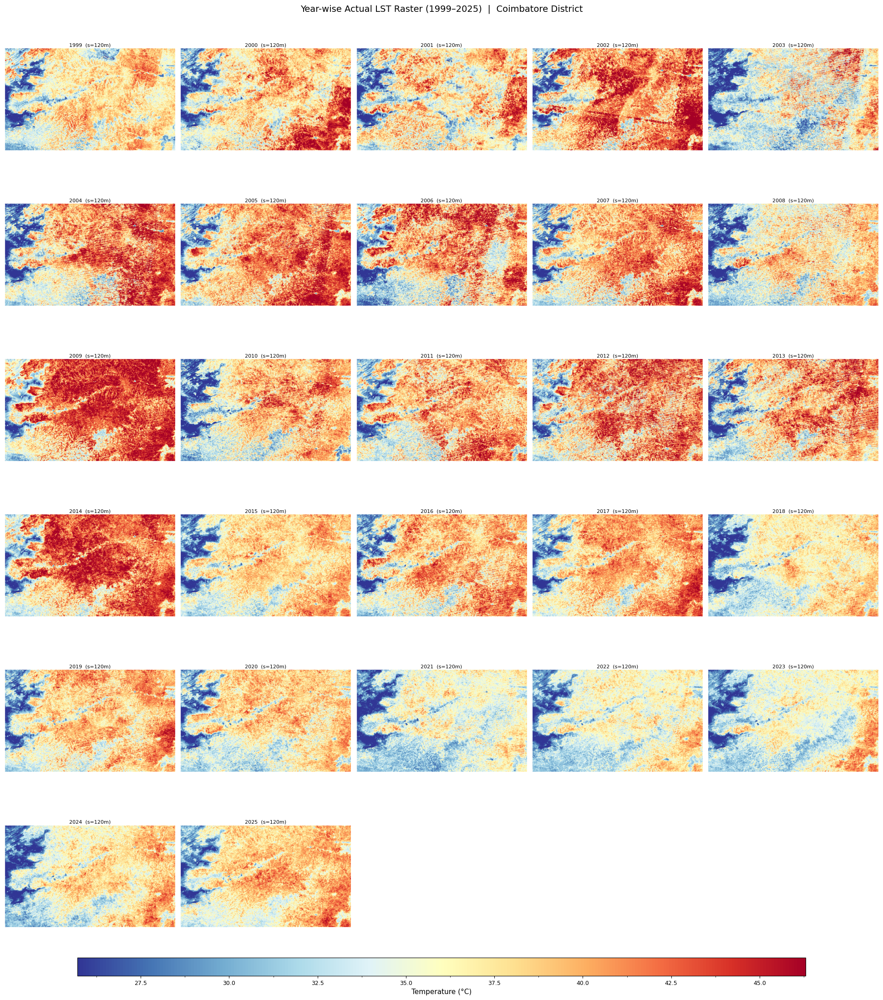

Saved → data\actual_lst_grid_1999_2025_6x5_boundary.png
Actual test rasters available for: [2021, 2022, 2023, 2024, 2025]


In [10]:

import gc
import warnings
import os
 
import ee
import geopandas as gpd
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import numpy as np
from shapely.geometry import shape
 
# ── 1. DERIVE AOI BOUNDARY FROM EE GEOMETRY (no shapefile required) ──────────
#
# We convert the EE Rectangle directly to a GeoDataFrame in EPSG:4326
# (which is what EE's geemap.ee_to_numpy always returns).
# CRS is guaranteed to match — no reprojection needed.
 
RASTER_EPSG = 4326   # EE / geemap default output CRS
 
try:
    aoi_geojson = aoi.getInfo()              # EE → Python dict
    gdf_boundary = gpd.GeoDataFrame(
        geometry=[shape(aoi_geojson)],
        crs=f"EPSG:{RASTER_EPSG}",
    )
    print(f"[CRS] ✓  AOI boundary created in EPSG:{RASTER_EPSG} — no reprojection needed.")
 
    # Bounding box for imshow extent (lon_min, lon_max, lat_min, lat_max)
    bounds      = gdf_boundary.total_bounds          # [minx, miny, maxx, maxy]
    EXTENT      = (bounds[0], bounds[2], bounds[1], bounds[3])
    print(f"[AOI] extent  lon {bounds[0]:.4f}→{bounds[2]:.4f}  "
          f"lat {bounds[1]:.4f}→{bounds[3]:.4f}")
 
except Exception as _e:
    gdf_boundary = None
    EXTENT       = None
    warnings.warn(
        f"Could not derive AOI boundary from EE ({_e}). "
        "Boundary overlay will be skipped.",
        stacklevel=2,
    )
 
LOCAL_DIR = 'data'          # ← set this to match your notebook
os.makedirs(LOCAL_DIR, exist_ok=True) 
# ── 2. DOWNLOAD ACTUAL YEARLY LST RASTERS FROM GEE ───────────────────────────
 
years_plot            = list(range(1999, 2026))
VIS_SCALE_TRIALS      = [120, 180, 240]
MAX_RETRIES_PER_SCALE = 3
MAX_SAMPLE_PER_YEAR   = 15_000
 
sampled_vals      = []
yearly_actual_lst = {}
used_scale        = {}
 
for yr in years_plot:
    try:
        img = build_year_image(yr)
        if img is None:
            print(f"Year {yr}: no image")
            continue
 
        lst_np, info = ee_to_numpy_with_retry(
            img.select("LST_C"), aoi, VIS_SCALE_TRIALS, MAX_RETRIES_PER_SCALE
        )
        if lst_np is None:
            print(f"Year {yr}: empty result")
            continue
 
        lst_np = lst_np.astype("float32", copy=False)
        lst_np[lst_np == -9999] = np.nan
        if lst_np.ndim == 3 and lst_np.shape[-1] == 1:
            lst_np = lst_np[:, :, 0]
 
        finite = lst_np[np.isfinite(lst_np)]
        if finite.size > 0:
            step = max(finite.size // MAX_SAMPLE_PER_YEAR, 1)
            sampled_vals.append(
                finite[::step][:MAX_SAMPLE_PER_YEAR].astype("float32", copy=False)
            )
            yearly_actual_lst[yr] = lst_np.astype("float16", copy=False)
            used_scale[yr]        = info
            print(f"Year {yr}: ok  scale={info} m  shape={lst_np.shape}")
        else:
            print(f"Year {yr}: only NaN pixels after masking")
 
    except Exception as e:
        print(f"Year {yr}: skipped ({e})")
 
if not yearly_actual_lst:
    raise RuntimeError("No yearly actual LST rasters available for plotting.")
 
all_vals = (
    np.concatenate(sampled_vals) if sampled_vals else np.array([0], dtype="float32")
)
vmin = float(np.percentile(all_vals, 2))
vmax = float(np.percentile(all_vals, 98))
print(f"\nColour scale (2nd–98th pct): {vmin:.2f} °C  →  {vmax:.2f} °C")
 
# ── 3. COLOUR MAP ─────────────────────────────────────────────────────────────
 
palette = [
    "#313695", "#4575b4", "#74add1", "#abd9e9",
    "#e0f3f8", "#ffffbf",
    "#fee090", "#fdae61", "#f46d43", "#d73027", "#a50026",
]
cmap = mcolors.LinearSegmentedColormap.from_list("lst_cmap_25y", palette)
 
# ── 4. GRID FIGURE ────────────────────────────────────────────────────────────
 
N_COLS = 5
N_ROWS = 6   # ceil(27 / 5) = 6
 
fig, axes = plt.subplots(N_ROWS, N_COLS, figsize=(20, 22))
 
fig.subplots_adjust(
    left   = 0.02,
    right  = 0.98,
    top    = 0.96,
    bottom = 0.07,   # space reserved for the horizontal colorbar
    hspace = 0.35,
    wspace = 0.03,   # ← very small column gap (Feature 3)
)
 
axes_flat = axes.flatten()
im = None
 
for i, yr in enumerate(years_plot):
    ax = axes_flat[i]
 
    if yr in yearly_actual_lst:
        arr = yearly_actual_lst[yr].astype("float32", copy=False)
 
        # 4a. Raster — pass extent so axes are in lon/lat space
        im = ax.imshow(
            arr,
            cmap    = cmap,
            vmin    = vmin,
            vmax    = vmax,
            origin  = "upper",
            extent  = EXTENT,    # (lon_min, lon_max, lat_min, lat_max)
            aspect  = "auto",
        )
 
        # 4b. AOI boundary overlay (Feature 1)
        if gdf_boundary is not None and EXTENT is not None:
            gdf_boundary.boundary.plot(
                ax        = ax,
                edgecolor = "white",   # white stands out on thermal palette
                linewidth = 0.9,
                alpha     = 0.95,
                zorder    = 5,
            )
 
        ax.set_title(f"{yr}  (s={used_scale[yr]}m)", fontsize=8, pad=2)
    else:
        ax.set_title(f"{yr}  (no data)", fontsize=8, pad=2)
 
    ax.axis("off")
 
# Hide the two unused grid cells (positions 27 and 28 in a 6×5 = 30-cell grid)
for j in range(len(years_plot), len(axes_flat)):
    axes_flat[j].set_visible(False)
 
# ── 5. HORIZONTAL COLORBAR AT THE BOTTOM (Feature 2) ─────────────────────────
#
# [left, bottom, width, height] all in figure-fraction units.
# Sits inside the bottom=0.07 margin reserved in subplots_adjust above.
 
if im is not None:
    cbar_ax = fig.add_axes([0.10, 0.028, 0.80, 0.018])
    cbar    = fig.colorbar(im, cax=cbar_ax, orientation="horizontal")
    cbar.set_label("Temperature (°C)", fontsize=11, labelpad=4)
    cbar.ax.xaxis.set_label_position("bottom")
    cbar.ax.xaxis.set_ticks_position("bottom")
    cbar.ax.tick_params(labelsize=9)
    cbar.ax.xaxis.set_minor_locator(mticker.AutoMinorLocator(2))
 
# ── 6. TITLE, SAVE, SHOW ──────────────────────────────────────────────────────
 
fig.suptitle(
    "Year-wise Actual LST Raster (1999–2025)  |  Coimbatore District",
    fontsize=14,
    y=0.997,
)
 
year_grid_png = os.path.join(LOCAL_DIR, "actual_lst_grid_1999_2025_6x5_boundary.png")
plt.savefig(year_grid_png, dpi=170, bbox_inches="tight")
plt.show()
print(f"Saved → {year_grid_png}")
 
# ── 7. RETAIN 2021-2025 ACTUAL RASTERS & CLEAN UP ────────────────────────────
 
for yr in range(2021, 2026):
    if yr in yearly_actual_lst:
        actual_test_rasters[yr] = yearly_actual_lst[yr].astype("float32", copy=False)
 
del yearly_actual_lst, sampled_vals, all_vals
gc.collect()
print(f"Actual test rasters available for: {sorted(actual_test_rasters.keys())}")

## Step 6 — Save output GeoTIFFs locally

In [11]:
# ── 6. Save actual / predicted / residual GeoTIFFs ───────────────────────────
# Self-contained save block so this cell runs reliably even after kernel restarts.
# Guard: check all required arrays exist before trying to save.
required = {'lst_arr': 'Step 4', 'pred_raster': 'Step 5e', 'pred_2030': 'Step 5f', 'pred_2040': 'Step 5f'}
for var_name, step_name in required.items():
    if var_name not in dir() or globals()[var_name] is None:
        raise RuntimeError(f'{var_name} is missing — run {step_name} first.')

OUT_DIR = LOCAL_DIR
os.makedirs(OUT_DIR, exist_ok=True)

# Output paths
ACTUAL_PATH = os.path.join(OUT_DIR, 'lst_actual_2025.tif')
PRED_PATH = os.path.join(OUT_DIR, 'lst_predicted_2025.tif')
PRED_2030_PATH = os.path.join(OUT_DIR, 'lst_predicted_2030.tif')
PRED_2040_PATH = os.path.join(OUT_DIR, 'lst_predicted_2040.tif')
RESID_PATH = os.path.join(OUT_DIR, 'lst_residual_2025.tif')
CHANGE_2030_PATH = os.path.join(OUT_DIR, 'lst_change_2030.tif')
CHANGE_2040_PATH = os.path.join(OUT_DIR, 'lst_change_2040.tif')

# Residual definitions
residual = np.asarray(lst_arr, dtype='float32') - np.asarray(pred_raster, dtype='float32')
# change_2030/2040 = projected warming relative to 2025 baseline (not residuals)
change_2030 = np.asarray(pred_2030, dtype='float32') - np.asarray(pred_raster, dtype='float32')
change_2040 = np.asarray(pred_2040, dtype='float32') - np.asarray(pred_raster, dtype='float32')

single_band_meta = meta.copy()
single_band_meta.update({
    'driver': 'GTiff',
    'count': 1,
    'dtype': 'float32',
    'nodata': -9999.0,
    'compress': 'LZW',
    'predictor': 2,
    'tiled': True,
    'BIGTIFF': 'IF_SAFER',
})

def to_writeable(a, nodata=-9999.0):
    a = np.asarray(a, dtype='float32')
    a = np.where(np.isfinite(a), a, nodata)
    return np.ascontiguousarray(a)

def write_tif_blockwise(path, arr, profile):
    arr = to_writeable(arr)
    local_profile = profile.copy()
    local_profile.update({'height': int(arr.shape[0]), 'width': int(arr.shape[1])})
    with rasterio.open(path, 'w', **local_profile) as dst:
        for _, window in dst.block_windows(1):
            r0, c0 = int(window.row_off), int(window.col_off)
            r1, c1 = r0 + int(window.height), c0 + int(window.width)
            dst.write(arr[r0:r1, c0:c1], 1, window=window)

# Write rasters
write_tif_blockwise(ACTUAL_PATH, lst_arr, single_band_meta)
write_tif_blockwise(PRED_PATH, pred_raster, single_band_meta)
write_tif_blockwise(PRED_2030_PATH, pred_2030, single_band_meta)
write_tif_blockwise(PRED_2040_PATH, pred_2040, single_band_meta)
write_tif_blockwise(RESID_PATH, residual, single_band_meta)
write_tif_blockwise(CHANGE_2030_PATH, change_2030, single_band_meta)
write_tif_blockwise(CHANGE_2040_PATH, change_2040, single_band_meta)

# Also save per-year predicted GeoTIFFs for 2021-2025
for yr in sorted(pred_test_rasters.keys()):
    p = os.path.join(OUT_DIR, f'lst_predicted_{yr}.tif')
    write_tif_blockwise(p, pred_test_rasters[yr], single_band_meta)
    print(f'  Saved → {p}')

print('\nAll GeoTIFFs saved.')

  Saved → data\lst_predicted_2021.tif
  Saved → data\lst_predicted_2022.tif
  Saved → data\lst_predicted_2023.tif
  Saved → data\lst_predicted_2024.tif
  Saved → data\lst_predicted_2025.tif

All GeoTIFFs saved.


## Step 7 — Static side-by-side map (Actual vs Predicted)

## Step 7b — Future raster maps (2030 and 2040)

Predicted (2021-2025, 2030, 2040) colour range: 27.3 °C  ->  40.3 °C


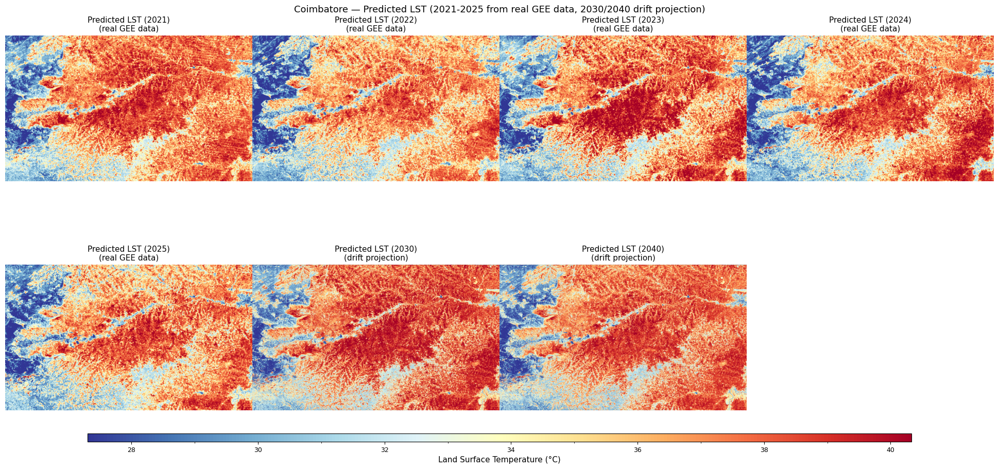

Saved -> data\lst_predicted_2021_2025_2030_2040.png


In [13]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.ticker as mticker
from matplotlib.gridspec import GridSpec
import numpy as np
import os
 
pred_rasters_plot = {
    2021: pred_test_rasters.get(2021),
    2022: pred_test_rasters.get(2022),
    2023: pred_test_rasters.get(2023),
    2024: pred_test_rasters.get(2024),
    2025: pred_test_rasters.get(2025),
    2030: pred_2030,
    2040: pred_2040,
}
 
pred_rasters_plot = {yr: arr for yr, arr in pred_rasters_plot.items() if arr is not None}
years_pred_plot   = list(pred_rasters_plot.keys())
pred_arrays       = [pred_rasters_plot[y] for y in years_pred_plot]
combined_pred     = np.concatenate([arr[np.isfinite(arr)] for arr in pred_arrays if np.isfinite(arr).any()])
vmin_p = float(np.percentile(combined_pred, 2))
vmax_p = float(np.percentile(combined_pred, 98))
print(f"Predicted (2021-2025, 2030, 2040) colour range: {vmin_p:.1f} °C  ->  {vmax_p:.1f} °C")
 
palette = [
    '#313695', '#4575b4', '#74add1', '#abd9e9',
    '#e0f3f8', '#ffffbf',
    '#fee090', '#fdae61', '#f46d43', '#d73027', '#a50026',
]
cmap = mcolors.LinearSegmentedColormap.from_list('lst_cmap', palette)
 
n     = len(years_pred_plot)
ncols = 4
nrows = (n + ncols - 1) // ncols
 
fig, axes = plt.subplots(nrows, ncols, figsize=(20, nrows * 4.5))
 
fig.subplots_adjust(
    left   = 0.02,
    right  = 0.98,
    top    = 0.93,
    bottom = 0.07,
    hspace = 0.35,
    wspace = 0.0,   # ← zero gap between columns
)
 
axes_flat = axes.flatten() if nrows > 1 else list(axes)
 
im = None
for i, yr in enumerate(years_pred_plot):
    ax      = axes_flat[i]
    arr     = pred_rasters_plot[yr]
    arr_disp = np.where(np.isfinite(arr), arr, np.nan)
    im      = ax.imshow(arr_disp, cmap=cmap, vmin=vmin_p, vmax=vmax_p)
    label   = '(drift projection)' if yr >= 2030 else '(real GEE data)'
    ax.set_title(f"Predicted LST ({yr})\n{label}", fontsize=11)
    ax.axis('off')
 
for j in range(len(years_pred_plot), len(axes_flat)):
    axes_flat[j].set_visible(False)
 
if im is None:
    raise RuntimeError('No rasters could be plotted — check GEE download errors above.')
 
# Horizontal colorbar at the bottom
cbar_ax = fig.add_axes([0.10, 0.028, 0.80, 0.018])
cbar    = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')
cbar.set_label('Land Surface Temperature (°C)', fontsize=11, labelpad=4)
cbar.ax.xaxis.set_label_position('bottom')
cbar.ax.xaxis.set_ticks_position('bottom')
cbar.ax.tick_params(labelsize=9)
cbar.ax.xaxis.set_minor_locator(mticker.AutoMinorLocator(2))
 
fig.suptitle(
    'Coimbatore — Predicted LST (2021-2025 from real GEE data, 2030/2040 drift projection)',
    fontsize=13, y=0.97,
)
 
out_pred_test = os.path.join(LOCAL_DIR, 'lst_predicted_2021_2025_2030_2040.png')
plt.savefig(out_pred_test, dpi=150, bbox_inches='tight')
plt.show()
print(f"Saved -> {out_pred_test}")

## Step 7c — Per-year actual vs predicted PNGs (2021-2025)

Comparison color range (2021-2025): 27.16 to 40.34 C


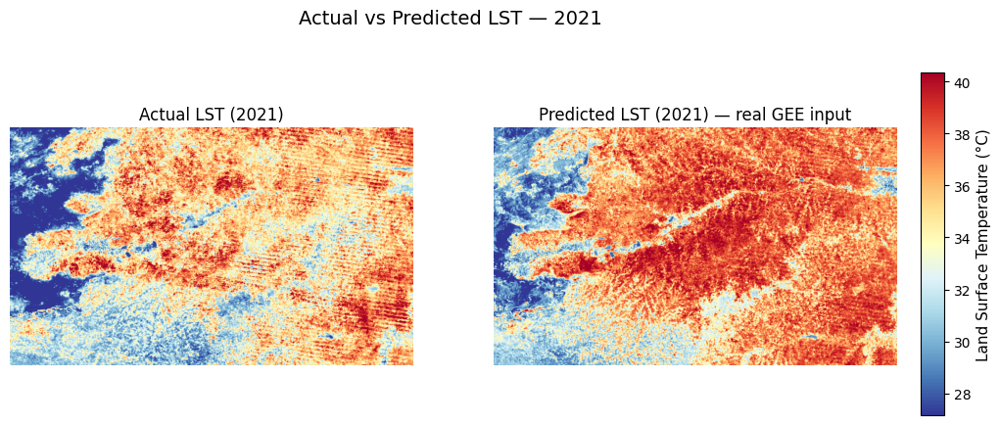

Saved -> data\lst_actual_vs_predicted_2021.png


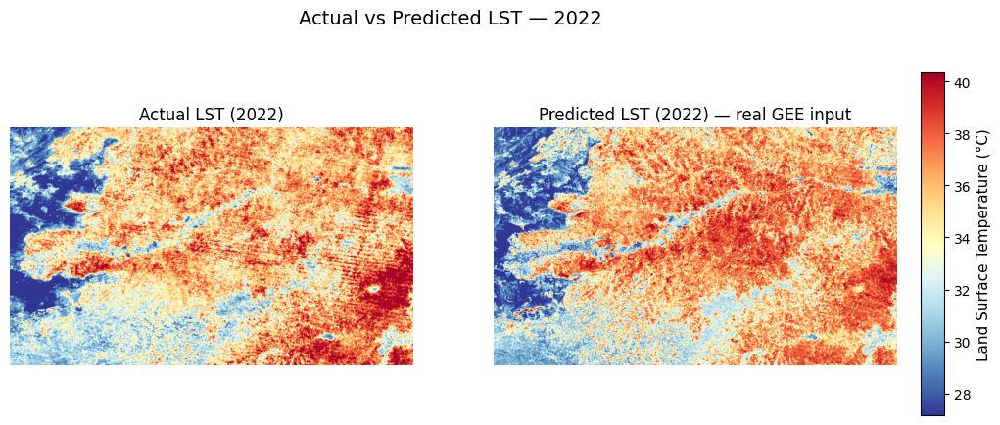

Saved -> data\lst_actual_vs_predicted_2022.png


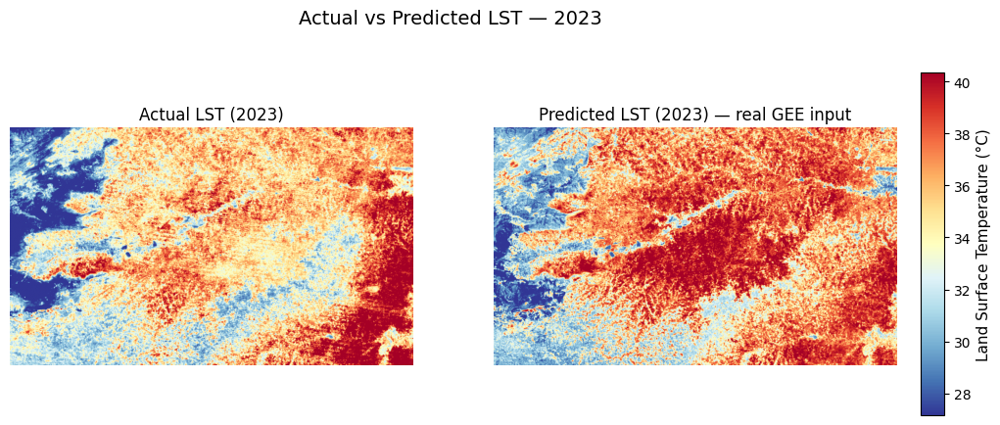

Saved -> data\lst_actual_vs_predicted_2023.png


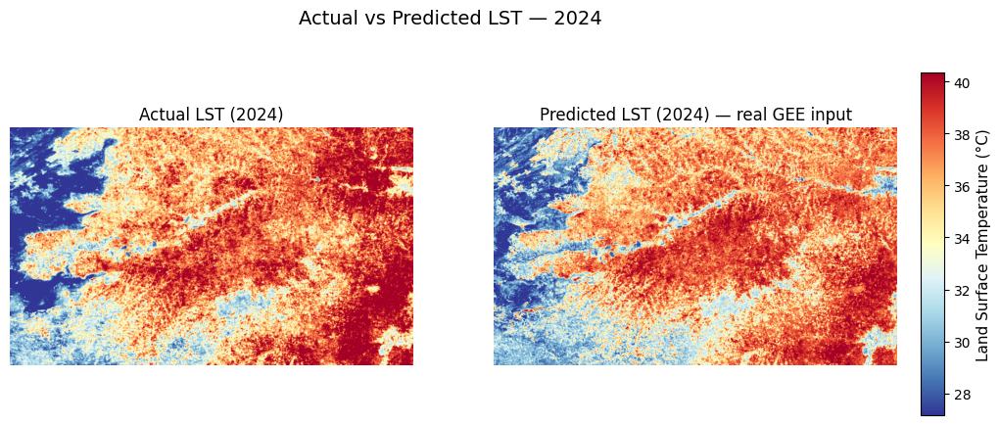

Saved -> data\lst_actual_vs_predicted_2024.png


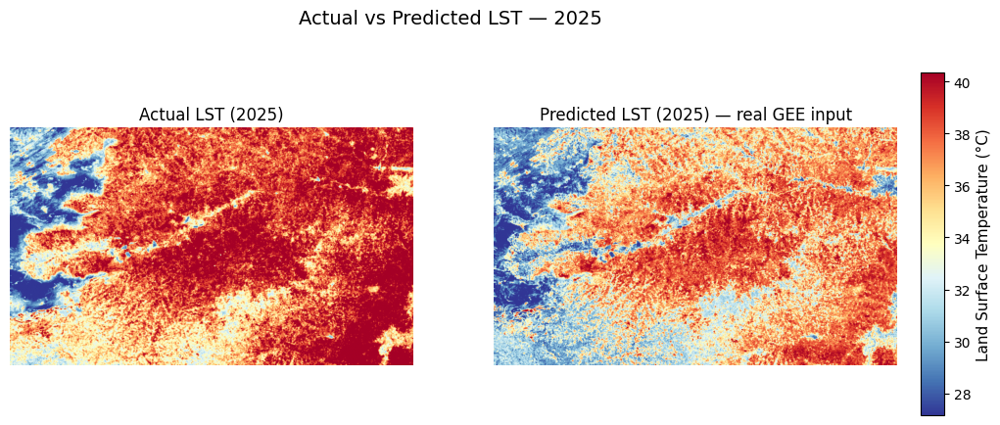

Saved -> data\lst_actual_vs_predicted_2025.png


In [14]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

if 'pred_test_rasters' not in globals() or not pred_test_rasters:
    raise RuntimeError('pred_test_rasters not found. Run Step 5f first.')

if 'actual_test_rasters' not in globals() or not actual_test_rasters:
    raise RuntimeError('actual_test_rasters not found. Run Step 5g first.')

years_cmp = [yr for yr in range(2021, 2026) if yr in pred_test_rasters and yr in actual_test_rasters]
if not years_cmp:
    raise RuntimeError('No overlapping years between actual and predicted rasters for 2021-2025.')

stack_vals = []
for yr in years_cmp:
    a = actual_test_rasters[yr]
    p = pred_test_rasters[yr]
    stack_vals.append(a[np.isfinite(a)])
    stack_vals.append(p[np.isfinite(p)])

all_vals = np.concatenate([v for v in stack_vals if v.size > 0])
vmin = float(np.percentile(all_vals, 2))
vmax = float(np.percentile(all_vals, 98))

palette = [
    '#313695', '#4575b4', '#74add1', '#abd9e9',
    '#e0f3f8', '#ffffbf',
    '#fee090', '#fdae61', '#f46d43', '#d73027', '#a50026',
]
cmap = mcolors.LinearSegmentedColormap.from_list('lst_cmp_cmap', palette)

print(f'Comparison color range (2021-2025): {vmin:.2f} to {vmax:.2f} C')

for yr in years_cmp:
    actual_arr = np.where(np.isfinite(actual_test_rasters[yr]), actual_test_rasters[yr], np.nan)
    pred_arr = np.where(np.isfinite(pred_test_rasters[yr]), pred_test_rasters[yr], np.nan)

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    im0 = axes[0].imshow(actual_arr, cmap=cmap, vmin=vmin, vmax=vmax)
    axes[0].set_title(f'Actual LST ({yr})', fontsize=12)
    axes[0].axis('off')

    axes[1].imshow(pred_arr, cmap=cmap, vmin=vmin, vmax=vmax)
    axes[1].set_title(f'Predicted LST ({yr}) — real GEE input', fontsize=12)
    axes[1].axis('off')

    fig.subplots_adjust(right=0.88)  # shrink plot area to make room

    cbar_ax = fig.add_axes([0.90, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
    cbar = fig.colorbar(im0, cax=cbar_ax, orientation='vertical')
    cbar.set_label('Land Surface Temperature (°C)', fontsize=11)
    cbar.ax.yaxis.set_label_position('right')
    cbar.ax.yaxis.set_ticks_position('right')

    plt.suptitle(f'Actual vs Predicted LST — {yr}', fontsize=14)
    # No tight_layout needed — subplots_adjust handles spacing

    out_path = os.path.join(LOCAL_DIR, f'lst_actual_vs_predicted_{yr}.png')
    plt.savefig(out_path, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'Saved -> {out_path}')

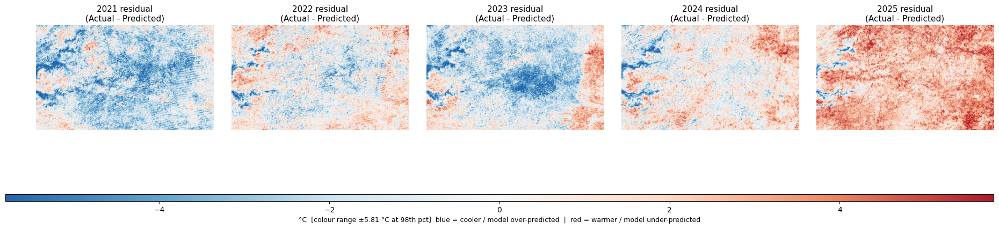

2021 residual — mean: -inf °C  std: nan °C
2022 residual — mean: -inf °C  std: nan °C
2023 residual — mean: -inf °C  std: nan °C
2024 residual — mean: -inf °C  std: nan °C
2025 residual — mean: -inf °C  std: nan °C
Saved -> data\lst_residual_2021_2025.png


c:\Users\Dharshan Rajiv .T\anaconda3\envs\lst_predict_env\lib\site-packages\numpy\lib\nanfunctions.py:1741: RuntimeWarning: invalid value encountered in subtract
  np.subtract(arr, avg, out=arr, casting='unsafe', where=where)


In [15]:
# ── Residual maps (2021-2025 only, shape-safe) ───────────────────────────────
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import os
from scipy.ndimage import zoom

if 'pred_test_rasters' not in globals() or not pred_test_rasters:
    raise RuntimeError('pred_test_rasters not found. Run Step 5f first.')
if 'actual_test_rasters' not in globals() or not actual_test_rasters:
    raise RuntimeError('actual_test_rasters not found. Run Step 5g first.')

years_res = [yr for yr in range(2021, 2026) if yr in pred_test_rasters and yr in actual_test_rasters]
if not years_res:
    raise RuntimeError('No overlapping years between actual and predicted rasters for 2021-2025.')

def resize_to_shape(arr, target_shape):
    arr = np.asarray(arr, dtype='float32')
    if arr.shape == target_shape:
        return arr
    zr = target_shape[0] / arr.shape[0]
    zc = target_shape[1] / arr.shape[1]
    out = zoom(arr, (zr, zc), order=1, mode='nearest').astype('float32', copy=False)

    # Guard for occasional 1-pixel interpolation rounding mismatch.
    if out.shape != target_shape:
        fixed = np.full(target_shape, np.nan, dtype='float32')
        r = min(target_shape[0], out.shape[0])
        c = min(target_shape[1], out.shape[1])
        fixed[:r, :c] = out[:r, :c]
        out = fixed
    return out

# Residual = Actual - Predicted (shape-aligned per year)
residual_maps = {}
for yr in years_res:
    actual_arr = np.asarray(actual_test_rasters[yr], dtype='float32')
    pred_arr = np.asarray(pred_test_rasters[yr], dtype='float32')
    pred_aligned = resize_to_shape(pred_arr, actual_arr.shape)
    residual_maps[yr] = actual_arr - pred_aligned

all_abs = np.concatenate([
    np.abs(residual_maps[yr][np.isfinite(residual_maps[yr])])
    for yr in years_res
    if np.isfinite(residual_maps[yr]).any()
])
if all_abs.size == 0:
    raise RuntimeError('Residual arrays contain no finite values.')
rlim = float(np.percentile(all_abs, 98))

resid_palette = ['#2166ac', '#67a9cf', '#d1e5f0', '#f7f7f7', '#fddbc7', '#ef8a62', '#b2182b']
resid_cmap = mcolors.LinearSegmentedColormap.from_list('resid_cmap', resid_palette)

n = len(years_res)
fig, axes = plt.subplots(1, n, figsize=(4.6 * n, 5))
axes = np.atleast_1d(axes)

im = None
for i, yr in enumerate(years_res):
    ax = axes[i]
    disp = np.where(np.isfinite(residual_maps[yr]), residual_maps[yr], np.nan)
    im = ax.imshow(disp, cmap=resid_cmap, vmin=-rlim, vmax=rlim)
    ax.set_title(f'{yr} residual\n(Actual - Predicted)', fontsize=11)
    ax.axis('off')

fig.subplots_adjust(bottom=0.12, hspace=0.35, wspace=0.1)

# Dedicated horizontal colorbar axis — [left, bottom, width, height]
cbar_ax = fig.add_axes([0.10, 0.04, 0.80, 0.025])
cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')
cbar.set_label(
    f'°C  [colour range ±{rlim:.2f} °C at 98th pct]  '
    'blue = cooler / model over-predicted  |  red = warmer / model under-predicted',
    fontsize=9
)
cbar.ax.xaxis.set_label_position('bottom')
cbar.ax.xaxis.set_ticks_position('bottom')

out_resid = os.path.join(LOCAL_DIR, 'lst_residual_2021_2025.png')
plt.savefig(out_resid, dpi=150, bbox_inches='tight')
plt.show()

for yr in years_res:
    arr = residual_maps[yr]
    print(f'{yr} residual — mean: {np.nanmean(arr):+.2f} °C  std: {np.nanstd(arr):.2f} °C')

print(f'Saved -> {out_resid}')